# Assignment 3: Methods and Plan
---

In [1]:
# load libraries
library(tidyverse)
library(GGally)
library(cowplot)
library(broom)
library(leaps)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2


Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp




## 1.0 Data

The provided dataset comprises information on the 215,029 most popular public GitHub repositories, ranked by the number of stars (likes) received from other GitHub users. Each repository in the dataset has a minimum of 167 stars. The dataset contains 24 variables and is publicly accessible via Kaggle: https://www.kaggle.com/datasets/donbarbos/github-repos/data.

The data was collected using the GitHub search API which allows users to perform advanced searches across public GitHub repositories. We consider the dataset to represent a sample of popular software projects.

**Table 1** provides a description of the variables present in the dataset.

**Table 1:** Description of variables in the GitHub repositories dataset.

| Name            | Description | Type        |
| -----------     | ----------- | ----------- |
| Name            | The name of the GitHub repository | Text |
| Description     | Summary of the purpose or focus of the repository | Text  |
| URL             | The unique URL or web address that links to the GitHub repository | Text  |
| Created At      | The date and time when the repository was initially created on GitHub, in ISO 8601 format | Date |
| Updated At      | The date and time of the most recent update or modification to the repository, in ISO 8601 format | Date |
| Homepage        | The URL to the homepage or landing page associated with the repository | Text |
| Size            | The size of the repository in bytes | Numerical, discrete |
| Stars           | The number of stars or likes that the repository has received from other GitHub users | Numerical, discrete |
| Forks           | The number of times the repository has been forked by other GitHub users | Numerical, discrete |
| Issues          | The total number of open issues | Numerical, discrete |
| Watchers        | The number of GitHub users who are "watching" or monitoring the repository for updates and changes | Numerical, discrete |
| Language        | The primary programming language | Categorical, nominal  |
| License         | Information about the software license using a license identifier | Categorical, nominal |
| Topics          | A list of topics or tags associated with the repository | Categorical, nominal |
| Has Issues      | A Boolean value indicating whether the repository has an issue tracker enabled. In this case, it's true, meaning it has an issue tracker | Categorical, nominal |
| Has Projects    | A Boolean value indicating whether the repository uses GitHub Projects to manage and organize tasks and work items | Categorical, nominal |
| Has Downloads   | A Boolean value indicating whether the repository offers downloadable files or assets to users | Categorical, nominal |
| Has Wiki        | A Boolean value indicating whether the repository has an associated wiki with additional documentation and information | Categorical, nominal |
| Has Pages       | A Boolean value indicating whether the repository has GitHub Pages enabled, allowing the creation of a website associated with the repository | Categorical, nominal |
| Has Discussions | A Boolean value indicating whether the repository has GitHub Discussions enabled, allowing community discussions and collaboration | Categorical, nominal |
| Is Fork         | A Boolean value indicating whether the repository is a fork of another repository. In this case, it's false, meaning it is not a fork | Categorical, nominal |
| Is Archived     | A Boolean value indicating whether the repository is archived. Archived repositories are typically read-only and are no longer actively maintained | Categorical, nominal |
| Is Template     | A Boolean value indicating whether the repository is set up as a template | Categorical, nominal |
| Default Branch  | The name of the default branch | Categorical, nominal |



## 2.0 Initial Questions

Prior to undertaking the exploratory data analysis and visualization the following was proposed: 

The response variable of interest is `Stars`, which represents a measure of GitHub repository popularity based on the number of stars or likes received from other GitHub users. The main input variables of interest include `Size`, `Forks`, and `Language`. These variables will be used to investigate the following inferential questions:

1. Is GitHub repository popularity associated with the size of the repository?
2. Is GitHub repository popularity associated with the number of times the repository has been forked by other GitHub users?
3. Is GitHub repository popularity associated with the primary programming language of the repository?
4. Are there significant interactions between the input variables when considering their effect on GitHub repository popularity? 

## 3.0 Exploratory Data Analysis and Visualization

To begin, we read the GitHub repositories dataset from GitHub into R and convert text-based variables to factors. The dataset, which is publicly accessible from Kaggle.com, is saved to the project's GitHub repository so that it can be easily read from the web into R.  **Table 2** provides a glimpse of the first six rows of the GitHub repositories dataset. **Table 3** is a summary of the structure of the dataset.  

In [2]:
#---------------------------------------------------------------
# Code to load data into R
#---------------------------------------------------------------

# set random seed
set.seed(2001)

# read raw data set from GitHub
repo_raw <- read_csv("https://github.com/jburden1/STAT301_Project_Group9/raw/main/data/repositories.csv")

# Change columns to factors
factor_columns <- (ncol(repo_raw) - 12):ncol(repo_raw)
repo_raw <- repo_raw %>%
  mutate(across(all_of(factor_columns), as.factor))


Rows: 215029 Columns: 24
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (8): Name, Description, URL, Homepage, Language, License, Topics, Defau...
dbl  (5): Size, Stars, Forks, Issues, Watchers
lgl  (9): Has Issues, Has Projects, Has Downloads, Has Wiki, Has Pages, Has ...
dttm (2): Created At, Updated At

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


**Table 2:** First six rows of the GitHub repositories dataset.

In [3]:
# Print Table 2
head(repo_raw)

Name,Description,URL,Created At,Updated At,Homepage,Size,Stars,Forks,Issues,⋯,Has Issues,Has Projects,Has Downloads,Has Wiki,Has Pages,Has Discussions,Is Fork,Is Archived,Is Template,Default Branch
<chr>,<chr>,<chr>,<dttm>,<dttm>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
freeCodeCamp,freeCodeCamp.org's open-source codebase and curriculum. Learn to code for free.,https://github.com/freeCodeCamp/freeCodeCamp,2014-12-24 17:49:19,2023-09-21 11:32:33,http://contribute.freecodecamp.org/,387451,374074,33599,248,⋯,TRUE,TRUE,TRUE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,main
free-programming-books,:books: Freely available programming books,https://github.com/EbookFoundation/free-programming-books,2013-10-11 06:50:37,2023-09-21 11:09:25,https://ebookfoundation.github.io/free-programming-books/,17087,298393,57194,46,⋯,TRUE,FALSE,TRUE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,main
awesome,😎 Awesome lists about all kinds of interesting topics,https://github.com/sindresorhus/awesome,2014-07-11 13:42:37,2023-09-21 11:18:22,NA,1441,269997,26485,61,⋯,TRUE,FALSE,TRUE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,main
996.ICU,Repo for counting stars and contributing. Press F to pay respect to glorious developers.,https://github.com/996icu/996.ICU,2019-03-26 07:31:14,2023-09-21 08:09:01,https://996.icu,187799,267901,21497,16712,⋯,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,TRUE,FALSE,master
coding-interview-university,A complete computer science study plan to become a software engineer.,https://github.com/jwasham/coding-interview-university,2016-06-06 02:34:12,2023-09-21 10:54:48,NA,20998,265161,69434,56,⋯,TRUE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,main
public-apis,A collective list of free APIs,https://github.com/public-apis/public-apis,2016-03-20 23:49:42,2023-09-21 11:22:06,http://public-apis.org,5088,256615,29254,191,⋯,TRUE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,master


**Table 3:** Structure of the GitHub repositories dataset.

In [4]:
# Print Table 3
str(repo_raw)

tibble [215,029 × 24] (S3: tbl_df/tbl/data.frame)
 $ Name           : chr [1:215029] "freeCodeCamp" "free-programming-books" "awesome" "996.ICU" ...
 $ Description    : chr [1:215029] "freeCodeCamp.org's open-source codebase and curriculum. Learn to code for free." ":books: Freely available programming books" "😎 Awesome lists about all kinds of interesting topics" "Repo for counting stars and contributing. Press F to pay respect to glorious developers." ...
 $ URL            : chr [1:215029] "https://github.com/freeCodeCamp/freeCodeCamp" "https://github.com/EbookFoundation/free-programming-books" "https://github.com/sindresorhus/awesome" "https://github.com/996icu/996.ICU" ...
 $ Created At     : POSIXct[1:215029], format: "2014-12-24 17:49:19" "2013-10-11 06:50:37" ...
 $ Updated At     : POSIXct[1:215029], format: "2023-09-21 11:32:33" "2023-09-21 11:09:25" ...
 $ Homepage       : chr [1:215029] "http://contribute.freecodecamp.org/" "https://ebookfoundation.github.io/free-programming

### 3.1 Cleaning and Wrangling Data

Having read the GitHub repositories dataset into R we proceed to clean and wrangle the dataset:

- We replace spaces in column names with underscores. This practice eliminates the necessity for special handling or the use of escaping characters when referring to column names in functions.
- From the initial set of 24 variables we exclude text-type variables that cannot be reasonably interpreted as factors, specifically `Name`, `Description`, `URL`, `Homepage`, `Topics` and `Default_Branch`.
- We drop the numerical variable `Watchers` which is identical (i.e., perfectly correlated) to the response variable of interest `Stars`.
- We drop the categorical variable `Is_Fork` which consists of only 1 level.
- We transform the date variables `Created_At` and `Updated_At` into `Age_Created` and `Age_Updated`, respectively, indicating the time elapsed in days relative to a presumed current date of *2024-03-18 12:00:00*.
- We summarize the count of NA values by variable, along with their proportions relative to the total number of observations in the raw dataset **(Table 4)**. We observe that NA values are only present for the categorical variables `Language` and `License`. Note that `License` includes the level "NOASSERTION" which is interpreted as an NA value. We opt to exclude all observations containing NA values from `Language`, a decision that does not critically reduce the total number of observations in the dataset. We choose to drop the variable `License` as opposed to removing nearly 35% of observations from the dataset.
- **Table 3** shows that the categorical variables `Language` comprises 369 levels. Upon closer examination, it becomes apparent that numerous levels consist of only a small number of observations. To simplify data handling and interpretation, we decide to filter the dataset to retain only those levels containing more than 5% of the total observations.
 
**Table 5** presents a summary of the structure of the tidy GitHub repositories dataset. The tidy dataset comprises 91,010 observations across 15 variables. We observe that the levels of categorical variable `Language` have been reduced to 6. 

In [5]:
#---------------------------------------------------------------
# Code to clean and wrangle data into tidy format
#---------------------------------------------------------------

repo_tidy <- repo_raw

# Replace spaces in column names with underscores
names(repo_tidy) <- gsub(" ", "_", names(repo_tidy))

# Exclude text-type variables that cannot be interpreted as factors 
repo_tidy <- repo_tidy %>%
    select(-Name, -Description, -URL, -Homepage, -Topics, -Default_Branch)

# Drop Watchers variable (identical to Stars)
repo_tidy <- repo_tidy %>%
    select(-Watchers)

# Drop Is_Fork variable (comprises 1 Level)
repo_tidy <- repo_tidy %>%
    select(-Is_Fork)

# Convert dates to age (days)
end_time <- as.POSIXct("2024-03-18 12:00:00")
repo_tidy <- repo_tidy %>%
    mutate(Age_Created = as.numeric(end_time - Created_At, units = "days"),
          Age_Updated = as.numeric(end_time - Updated_At, units = "days"))

# Drop original date columns
repo_tidy <- repo_tidy %>%
    select(-Created_At, -Updated_At)

# Reorder columns with Age columns at the front
repo_tidy <- repo_tidy %>%
  select(Age_Created, Age_Updated, everything())

# Summarize NA count
na_count <- repo_tidy %>%
  summarise_all(~ sum(is.na(.) | . == "NOASSERTION"))
na_count_long <- na_count %>% 
    pivot_longer(cols = everything(), names_to = "variable", values_to = "count") %>%
    mutate("prop" = count / nrow(repo_tidy)) %>%
    arrange(desc(count))

# Drop NA rows
repo_tidy <- drop_na(repo_tidy)

# Drop License variable
repo_tidy <- repo_tidy %>%
    select(-License)

# Summarize Language levels and identify those exceeding 5%
repo_lang_summary <- repo_tidy %>%
    group_by(Language) %>%
    summarize(count = n(), prop = count / nrow(repo_tidy)) %>%
    arrange(desc(count))
repo_lang_filter <- repo_lang_summary %>%
    filter(prop > 0.05) %>%
    pull(Language)

# Filter data by Language
repo_tidy_filtered <- repo_tidy %>%
  filter(Language %in% repo_lang_filter)

# Update Language levels
repo_tidy_filtered$Language <- droplevels(repo_tidy_filtered$Language)
repo_tidy_filtered$Language <- as.factor(repo_tidy_filtered$Language)

**Table 4:** Summary of count and proportion of NA values.

In [6]:
# Print Table 4
na_count_long

variable,count,prop
<chr>,<int>,<dbl>
License,74188,0.34501393
Language,16076,0.07476201
Age_Created,0,0.00000000
Age_Updated,0,0.00000000
Size,0,0.00000000
Stars,0,0.00000000
Forks,0,0.00000000
Issues,0,0.00000000
Has_Issues,0,0.00000000


**Table 5:** Structure of the tidy GitHub repositories dataset.

In [7]:
# Print Table 5
str(repo_tidy_filtered)

tibble [91,010 × 15] (S3: tbl_df/tbl/data.frame)
 $ Age_Created    : num [1:91010] 3372 2920 2560 2577 3951 ...
 $ Age_Updated    : num [1:91010] 179 179 179 179 179 ...
 $ Size           : num [1:91010] 387451 5088 2267461 11187 345964 ...
 $ Stars          : num [1:91010] 374074 256615 251416 229569 213299 ...
 $ Forks          : num [1:91010] 33599 29254 34927 40474 44842 ...
 $ Issues         : num [1:91010] 248 191 643 393 1497 ...
 $ Language       : Factor w/ 6 levels "C++","Go","Java",..: 6 5 6 5 4 6 5 1 4 5 ...
 $ Has_Issues     : Factor w/ 2 levels "FALSE","TRUE": 2 2 2 2 2 2 1 2 2 2 ...
 $ Has_Projects   : Factor w/ 2 levels "FALSE","TRUE": 2 1 1 2 2 2 1 2 1 2 ...
 $ Has_Downloads  : Factor w/ 2 levels "FALSE","TRUE": 2 2 2 2 2 2 2 2 2 2 ...
 $ Has_Wiki       : Factor w/ 2 levels "FALSE","TRUE": 1 1 2 2 2 2 1 1 1 2 ...
 $ Has_Pages      : Factor w/ 2 levels "FALSE","TRUE": 2 1 2 1 2 1 2 1 1 1 ...
 $ Has_Discussions: Factor w/ 2 levels "FALSE","TRUE": 1 1 1 1 1 1 1 1 1 2 ...


### 3.2 Tidy Sample

To facilitate easier handling and interpretation of the data, we opt to take a random sample of 2000 observations from the tidy dataset. **Tables 6 - 8** provide a high level summary of the `tidy_sample` data. **Table 6** provides a summary of the counts and proportions for the categorical variable `Language` which comprises 6 levels. **Table 7** provides a summary of the counts and proportions for the eight Boolean (i.e., 2 level) categorical variables and **Table 8** presents summary statistics for the six numerical variables.

In [8]:
set.seed(2001)
# generate sample of 2000 observations
tidy_sample <- sample_n(repo_tidy_filtered, size = 2000, replace = FALSE)

**Table 6:** Summary of Language level counts and proportions in the tidy sample.

In [9]:
# Print Table 6
lang_summary <- tidy_sample %>%
    group_by(Language) %>%
    summarize(count = n(), prop = count / nrow(tidy_sample)) %>%
    arrange(desc(count))
lang_summary

Language,count,prop
<fct>,<int>,<dbl>
Python,585,0.2925
JavaScript,568,0.2840
Java,243,0.1215
TypeScript,218,0.1090
Go,212,0.1060
C++,174,0.0870


**Table 7:** Summary of level counts and proportions for Boolean categorical variables in the tidy sample.

In [10]:
# Print Table 7
bool_summary <- tidy_sample %>%
    select(Has_Issues, Has_Projects, Has_Downloads, Has_Wiki, Has_Pages, Has_Discussions, Is_Archived, Is_Template) %>%
    pivot_longer(cols = everything(), names_to = "variable", values_to = "bool") %>%
    mutate(bool = as.logical(bool)) %>%
    group_by(variable) %>%
    summarize(count_true = sum(bool), prop_true = count_true / nrow(tidy_sample), 
              count_false = nrow(tidy_sample) - count_true, prop_false = count_false / nrow(tidy_sample))
bool_summary

variable,count_true,prop_true,count_false,prop_false
<chr>,<int>,<dbl>,<int>,<dbl>
Has_Discussions,323,0.1615,1677,0.8385
Has_Downloads,1981,0.9905,19,0.0095
Has_Issues,1939,0.9695,61,0.0305
Has_Pages,454,0.2270,1546,0.7730
Has_Projects,1719,0.8595,281,0.1405
Has_Wiki,1509,0.7545,491,0.2455
Is_Archived,146,0.0730,1854,0.9270
Is_Template,14,0.0070,1986,0.9930


**Table 8:** Summary statistics for numerical variables in the tidy sample.

In [11]:
# Print Table 8
cont_summary <- tidy_sample %>%
    select(Age_Created, Age_Updated, Size, Stars, Forks, Issues) %>%
    pivot_longer(cols = everything(), names_to = "variable", values_to = "val") %>%
    group_by(variable) %>%
    summarize(min = min(val), max = max(val), mean = mean(val), sd = sd(val))
cont_summary

variable,min,max,mean,sd
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
Age_Created,192.8733,5703.867,2502.9014,1142.56297
Age_Updated,174.7598,1040.535,193.8833,42.40737
Forks,0.0000,15077.000,267.4550,827.51632
Issues,0.0000,2668.000,47.1610,135.89707
Size,4.0000,5722310.000,39394.3960,217991.90713
Stars,167.0000,109151.000,1442.5295,4553.17983


### 3.3 Preliminary Visualizations

We prepare preliminary visualizations to explore the relationships between the available input variables and the response variable of interest, `Stars`.

#### 3.3.1 Numerical Input Variables

The scatter plot matrix in **Figure 1** illustrates the relationships between the numerical input variables and the response variable `Stars`. The plots utilize a log-log scale, enhancing the visualization of the data range. Notably, the input variables `Forks` and `Issues` exhibit the strongest association with the response `Stars`.

On **Figure 2**, a heatmap overlays a correlation matrix depicting the correlation between the numerical input variables. The presence of relatively low correlation values indicates that multicollinearity among the input variables is not a significant concern.

In [12]:
options(repr.plot.width = 15, repr.plot.height = 8)

#---------------------------------------------------------------
# Code to created combined scatterplots
#---------------------------------------------------------------

plot_forks <- tidy_sample %>%
    ggplot(aes(x = Forks, y = Stars)) +
    geom_point() +
    geom_smooth(method = "lm", formula = y ~ x, se = FALSE) +
    xlab("Forks") +
    scale_y_log10() +
    scale_x_log10() 
plot_size <- tidy_sample %>%
    ggplot(aes(x = Size, y = Stars)) +
    geom_point() +
    geom_smooth(method = "lm", formula = y ~ x, se = FALSE) +
    xlab("Size (bytes)") +
    scale_y_log10() +
    scale_x_log10() 
plot_age_created <- tidy_sample %>%
    ggplot(aes(x = Age_Created, y = Stars)) +
    geom_point() +
    geom_smooth(method = "lm", formula = y ~ x, se = FALSE) +
    xlab("Age_Created (days)") +
    scale_y_log10() +
    scale_x_log10() 
plot_age_updated <- tidy_sample %>%
    ggplot(aes(x = Age_Updated, y = Stars)) +
    geom_point() + 
    geom_smooth(method = "lm", formula = y ~ x, se = FALSE) +
    xlab("Age_Updated (days)") +
    scale_y_log10() +
    scale_x_log10() 
plot_issues <- tidy_sample %>%
    ggplot(aes(x = Issues, y = Stars)) +
    geom_point() +
    geom_smooth(method = "lm", formula = y ~ x, se = FALSE) +
    xlab("Issues") +
    scale_y_log10() +
    scale_x_log10() 

scatter_matrix <- plot_grid(plot_forks, plot_size, plot_age_created, plot_age_updated, plot_issues, ncol = 2)

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 2 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 150 rows containing non-finite values (`stat_smooth()`).”


**Figure 1:** Input-response scatter plot matrix.

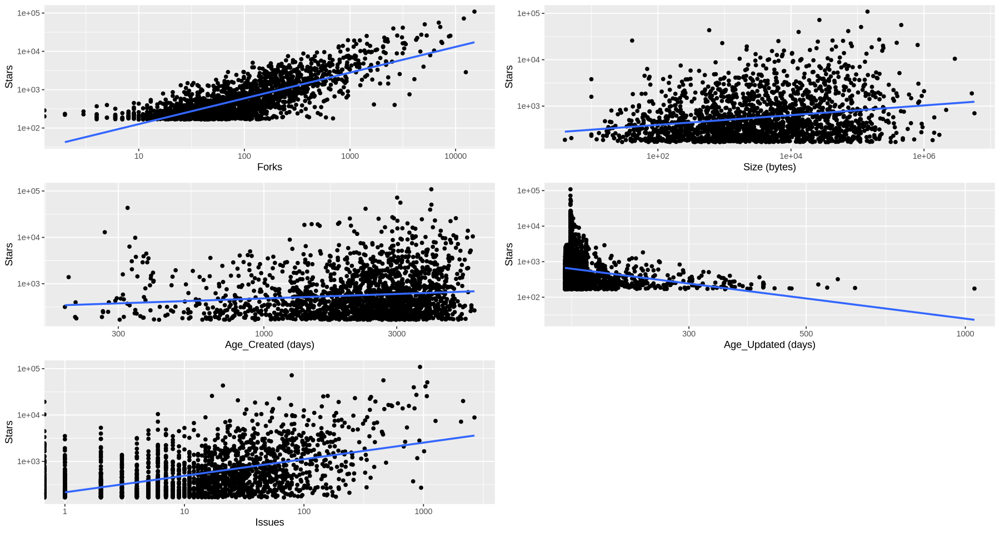

In [13]:
scatter_matrix

In [14]:
options(repr.plot.width = 15, repr.plot.height = 8)

#---------------------------------------------------------------
# Code to created correlation matrix
#---------------------------------------------------------------

corr_matrix <- tidy_sample %>%
  select(Forks, Size, Age_Created, Age_Updated, Issues) %>% 
  cor() %>%
  as.data.frame() %>%
  rownames_to_column("var1") %>%
  pivot_longer(-var1, names_to = "var2", values_to = "corr")

plot_corr_matrix <- corr_matrix %>%
  ggplot(aes(x = var1, y = var2)) +
  geom_tile(aes(fill = corr), color = "white") +
  scale_fill_distiller(name = "Correlation Coefficient \n",
    palette =  "YlOrRd",
    direction = 1,
    limits = c(-1,1)
  ) +
  labs(x = "Variable 1", y = "Variable 2") +
  theme_minimal() +
  theme(
    axis.text.x = element_text(
      angle = 45, vjust = 1,
      size = 18, hjust = 1
    ),
    axis.text.y = element_text(
      vjust = 1,
      size = 18, hjust = 1
    ),
    legend.title = element_text(size = 18, face = "bold"),
    legend.text = element_text(size = 18),
    legend.key.size = unit(2, "cm")
  ) +
  coord_fixed() +
  geom_text(aes(x = var1, y = var2, label = round(corr, 2)), color = "black", size = 6)

**Figure 2:** Correlation matrix.

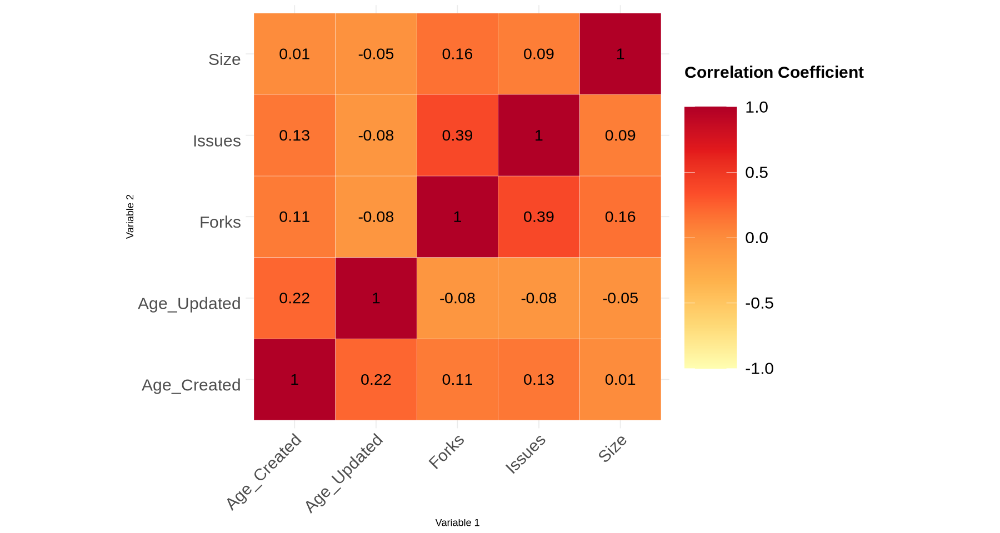

In [15]:
plot_corr_matrix

#### 3.3.2 Categorical Input Variables

**Figure 3** displays boxplots comparing the distribution of the response variable `Stars` across the available Boolean categorical input variables. It is noteworthy that variables including `Has_Downloads`, `Has_Issues`, `Is_Archived`, and `Is_Template` exhibit highly uneven distributions across their levels, limiting their suitability as input variables. The significance of the remaining Boolean categorical input variables (`Has_Discussions`, `Has_Pages`, `Has_Projects`, and `Has_Wiki`) will be assessed during the development of the generative model.

**Figure 4** displays boxplots comparing the distribution of the response variable `Stars` for the different levels of the categorical input variable `Language`. Visually, the mean and spread of the distributions across the various languages appears similar.

In [16]:
options(repr.plot.width = 15, repr.plot.height = 8)

#---------------------------------------------------------------
# Code to created combined boxplots
#---------------------------------------------------------------

box_issues <- tidy_sample %>%
    ggplot(aes(x=Has_Issues, y=Stars, fill=Has_Issues)) + 
    geom_boxplot() +
    geom_jitter(color="black", size=0.2, alpha=0.5) +
    theme(
        text = element_text(size = 14),
        plot.title = element_text(face = "bold"),
        axis.title = element_text(face = "bold")
      ) +
    guides(fill = FALSE) +
    stat_summary(aes(x = Has_Issues, y = Stars, fill = Has_Issues),
                 fun = mean, colour = "yellow", geom = "point",
                 shape = 18, size = 5) +
    scale_y_log10()

box_projects <- tidy_sample %>%
    ggplot(aes(x=Has_Projects, y=Stars, fill=Has_Projects)) + 
    geom_boxplot() +
    geom_jitter(color="black", size=0.2, alpha=0.5) +
    theme(
        text = element_text(size = 14),
        plot.title = element_text(face = "bold"),
        axis.title = element_text(face = "bold")
      ) +
    guides(fill = FALSE) +
    stat_summary(aes(x = Has_Projects, y = Stars, fill = Has_Projects),
                 fun = mean, colour = "yellow", geom = "point",
                 shape = 18, size = 5) +
    scale_y_log10()

box_downloads <- tidy_sample %>%
    ggplot(aes(x=Has_Downloads, y=Stars, fill=Has_Downloads)) + 
    geom_boxplot() +
    geom_jitter(color="black", size=0.2, alpha=0.5) +
    theme(
        text = element_text(size = 14),
        plot.title = element_text(face = "bold"),
        axis.title = element_text(face = "bold")
      ) +
    guides(fill = FALSE) +
    stat_summary(aes(x = Has_Downloads, y = Stars, fill = Has_Downloads),
                 fun = mean, colour = "yellow", geom = "point",
                 shape = 18, size = 5) +
    scale_y_log10()

box_wiki <- tidy_sample %>%
    ggplot(aes(x=Has_Wiki, y=Stars, fill=Has_Wiki)) + 
    geom_boxplot() +
    geom_jitter(color="black", size=0.2, alpha=0.5) +
    theme(
        text = element_text(size = 14),
        plot.title = element_text(face = "bold"),
        axis.title = element_text(face = "bold")
      ) +
    guides(fill = FALSE) +
    stat_summary(aes(x = Has_Wiki, y = Stars, fill = Has_Wiki),
                 fun = mean, colour = "yellow", geom = "point",
                 shape = 18, size = 5) +
    scale_y_log10()

box_pages <- tidy_sample %>%
    ggplot(aes(x=Has_Pages, y=Stars, fill=Has_Pages)) + 
    geom_boxplot() +
    # scale_fill_viridis(discrete = TRUE, alpha=0.6) +
    geom_jitter(color="black", size=0.2, alpha=0.5) +
    theme(
        text = element_text(size = 14),
        plot.title = element_text(face = "bold"),
        axis.title = element_text(face = "bold")
      ) +
    guides(fill = FALSE) +
    stat_summary(aes(x = Has_Pages, y = Stars, fill = Has_Pages),
                 fun = mean, colour = "yellow", geom = "point",
                 shape = 18, size = 5) +
    scale_y_log10()

box_discussions <- tidy_sample %>%
    ggplot(aes(x=Has_Discussions, y=Stars, fill=Has_Discussions)) + 
    geom_boxplot() +
    geom_jitter(color="black", size=0.2, alpha=0.5) +
    theme(
        text = element_text(size = 14),
        plot.title = element_text(face = "bold"),
        axis.title = element_text(face = "bold")
      ) +
    guides(fill = FALSE) +
    stat_summary(aes(x = Has_Discussions, y = Stars, fill = Has_Discussions),
                 fun = mean, colour = "yellow", geom = "point",
                 shape = 18, size = 5) +
    scale_y_log10()

box_archived <- tidy_sample %>%
    ggplot(aes(x=Is_Archived, y=Stars, fill=Is_Archived)) + 
    geom_boxplot() +
    geom_jitter(color="black", size=0.2, alpha=0.5) +
    theme(
        text = element_text(size = 14),
        plot.title = element_text(face = "bold"),
        axis.title = element_text(face = "bold")
      ) +
    guides(fill = FALSE) +
    stat_summary(aes(x = Is_Archived, y = Stars, fill = Is_Archived),
                 fun = mean, colour = "yellow", geom = "point",
                 shape = 18, size = 5) +
    scale_y_log10()

box_template <- tidy_sample %>%
    ggplot(aes(x=Is_Template, y=Stars, fill=Is_Template)) + 
    geom_boxplot() +
    geom_jitter(color="black", size=0.2, alpha=0.5) +
    theme(
        text = element_text(size = 14),
        plot.title = element_text(face = "bold"),
        axis.title = element_text(face = "bold")
      ) +
    guides(fill = FALSE) +
    stat_summary(aes(x = Is_Template, y = Stars, fill = Is_Template),
                 fun = mean, colour = "yellow", geom = "point",
                 shape = 18, size = 5) +
    scale_y_log10()

box_combined <- plot_grid(box_issues, box_projects, box_downloads, box_wiki,
                          box_pages, box_discussions, box_archived, box_template, ncol = 4)

Warning message:
“The `<scale>` argument of `guides()` cannot be `FALSE`. Use "none" instead as
of ggplot2 3.3.4.”


**Figure 3:** Boxplots for Boolean categorical input variables.

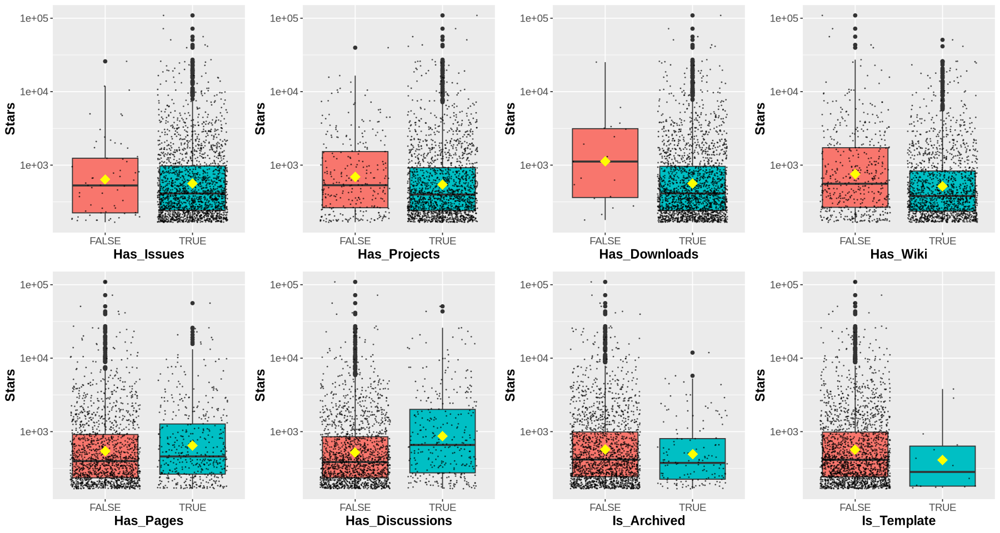

In [17]:
box_combined

In [18]:
options(repr.plot.width = 15, repr.plot.height = 8)

#---------------------------------------------------------------
# Code to created Language boxplot
#---------------------------------------------------------------

box_language <- tidy_sample %>%
    ggplot(aes(x=Language, y=Stars, fill=Language)) + 
    geom_boxplot() +
    geom_jitter(color="black", size=0.2, alpha=0.5) +
    theme(
        text = element_text(size = 14),
        plot.title = element_text(face = "bold"),
        axis.title = element_text(face = "bold")
      ) +
    guides(fill = FALSE) +
    stat_summary(aes(x = Language, y = Stars, fill = Language),
                 fun = mean, colour = "yellow", geom = "point",
                 shape = 18, size = 5) +
    scale_y_log10()

**Figure 4:** Boxplots for Language categorical input variable.

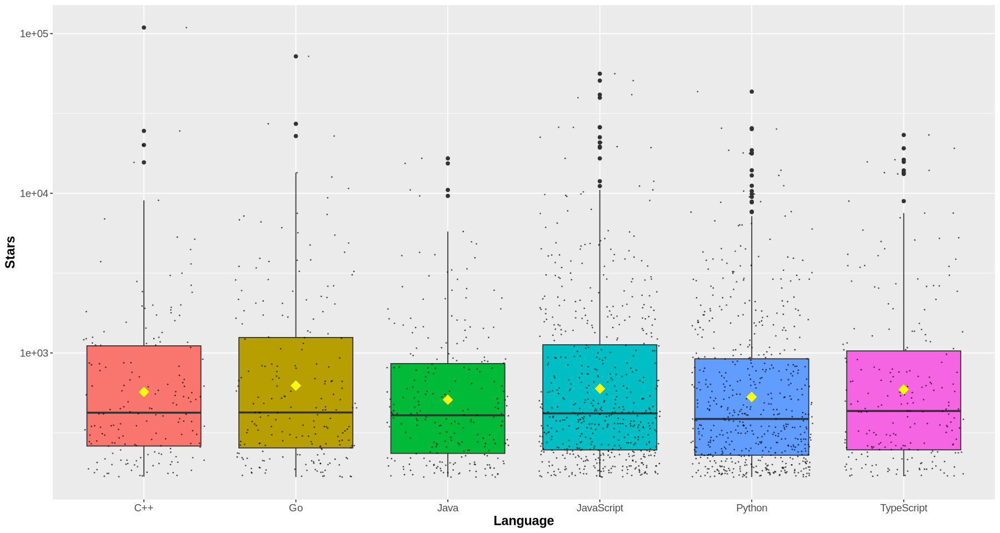

In [19]:
box_language

#### 3.3.2 Combo Plot

**Figure 5** is a combo scatterplot showing the relationship between the numerical input variables `Forks`, `Issues` and `Language` and the response variable of interest `Stars`.

In [20]:
options(repr.plot.width = 15, repr.plot.height = 8)

#---------------------------------------------------------------
# Code to created combo scatter plot
#---------------------------------------------------------------

combo_plot <- tidy_sample %>%
    ggplot(aes(x = Forks, y = Stars, color = Language, size = Issues)) +
    geom_point() +
    scale_size(range = c(1, 10)) +
    xlab("Forks") +
    scale_y_log10() +
    scale_x_log10() 

**Figure 5:** Combo scatterplot.

Warning message:
“Transformation introduced infinite values in continuous x-axis”


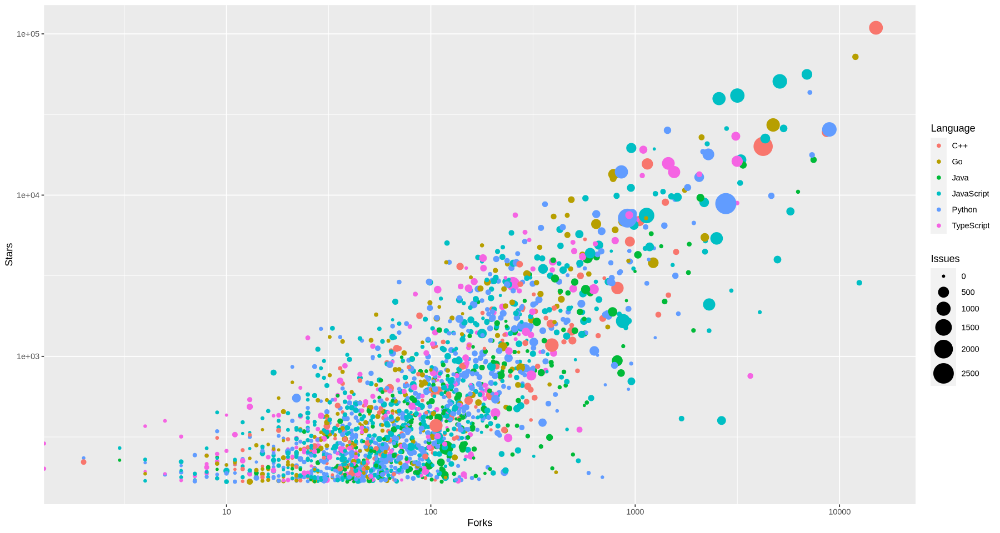

In [21]:
combo_plot

### 3.4 Summary

The following summarizes the results of the exploratory data analysis and visualization:
- The raw GitHub repositories dataset comprises 215,029 observations across 24 variables. Cleaning and wrangling the data into a tidy format reduced the dataset to 91,010 observations across 15 variables.
- To facilitate data handling and interpretation, the categorical variable `Language`, initially comprising 369 levels, was filtered to retain only levels containing more than 5% of the total observations in the tidy dataset. The filtered list of language levels includes `C++`, `Go`, `Java`, `JavaScript`, `Python`, and `TypeScript`.
- To facilitate easier handling and interpretation of the data, we opted to take a random sample of 2000 observations from the tidy dataset. The tidy sample will be used as the basis for future assessments.
- The numerical input variables `Forks` and `Issues` exhibit the strongest association with the response `Stars` **(Figure 1)**. Notably `Size`, which was identified as an input variable of interest in the initial questions (Section 2.0), appears to show a very weak association with the response. The variables `Age_Created` and `Age_Updated` appear to show little to no association with the response.  
- The presence of low correlation values indicates that multicollinearity among the numerical input variables is not a significant concern.
- Boolean categorical variables `Has_Downloads`, `Has_Issues`, `Is_Archived`, and `Is_Template` exhibit highly uneven distributions across their levels, limiting their suitability as input variables. These variables will not be considered during development of the generative model.
- Boolean categorical input variables `Has_Discussions`, `Has_Pages`, `Has_Projects`, and `Has_Wiki` have similar distributions and means. Their significance will be assessed during the development of the generative model.
- The distributions and means of the various levels of the `Language` variable appear similar. We conclude that the effect size of `Language` is not significant enough to justify its inclusion in the generative model.



**Table 9:** Input variables to be considered in the development of the generative model.

| Name            | Description | Type        |
| -----------     | ----------- | ----------- |
| Age_Created     | The age (in days) since the repository was initially created on GitHub| Numerical, continuous |
| Age_Updated     | The age (in days) since the most recent update or modification to the repository | Numerical, continuous |
| Size            | The size of the repository in bytes | Numerical, discrete |
| Forks           | The number of times the repository has been forked by other GitHub users | Numerical, discrete |
| Issues          | The total number of open issues | Numerical, discrete |
| Has_Projects    | A Boolean value indicating whether the repository uses GitHub Projects to manage and organize tasks and work items | Categorical, nominal |
| Has_Wiki        | A Boolean value indicating whether the repository has an associated wiki with additional documentation and information | Categorical, nominal |
| Has_Pages       | A Boolean value indicating whether the repository has GitHub Pages enabled, allowing the creation of a website associated with the repository | Categorical, nominal |
| Has_Discussions | A Boolean value indicating whether the repository has GitHub Discussions enabled, allowing community discussions and collaboration | Categorical, nominal |

### 3.5 Updated Questions

The response variable of interest is `Stars`, which represents a measure of GitHub repository popularity based on the number of stars or likes received from other GitHub users. The main input variables of interest include `Forks` and `Issues`. Following completion of the exploratory analysis and visualization, we pose the following questions:

1. Is GitHub repository popularity associated with the number of times the repository has been forked by other GitHub users?
2. Is GitHub repository popularity associated with the total number of open issues in the repository?
3. Is GitHub repository popularity associated with any of the Boolean categorical variables `Has_Discussions`, `Has_Pages`, `Has_Projects`, and `Has_Wiki`?
4. Can we use feature selection algorithm to 

To address these questions, we will develop a multiple linear regression model. This model will incorporate the input variables of interest: `Forks`, `Issues`, and `Language`. Additional input variables will be assessed and may be included to improve the goodness of fit of the model and/or help control for potential confounding effects. The generative model will be used to assess the association between the input variables of interest and the numerical response variable, `Stars`.

## 5.0 Methods and Plan

Assignment 3: Methods and Plan

Propose one method to address your question of interest using the selected dataset and explain why it was chosen. In your explanation respond to the following questions:

Why is this method appropriate?
Which assumptions are required, if any, to apply the method selected? If this was not covered in the course, you can skip this part.
What are potential limitations or weaknesses of the method selected?
As mentioned before, it is fine to share ideas with other group members. However, you don’t need to agree on a unique common method for the group project. In fact, usually the analysis comprise different methods with different strengths and limitations! Regardless of how many methods are proposed within each group, each team member needs to propose one method and justify its choice.

Word count limit: 500 words for the new part of the assignment (Methods and Plan).
Submit as soon as you are done so that we can start giving you feedback to continue just after the deadline. Note that you don't have to implement your proposal (no coding required for now!!)

Note 1: you can relax/expand your question(s) in this assignment. You don't need to change the question from previous assignment (unless totally unrelated). For example, even if your main interest is to analyze the relation between the price of a property and its size, the analysis can (need to) include other variables in the data. You can make a light pre-selection if the data contains many variables that seem problematic (e.g., with majority of missing values or too large number of levels) but you need to clearly justify your decision. 

Note 2: keep populating your previous assignment. That is, include the explanation of the data, questions and brief EDA. We won't re-grade past parts but it helps us to understand your reasoning.

- Feature Selection process
    - exclude irrelevant variables from a multiple regression model.
    - Methods: Subset Selection, Shrinkage.
- Additive model
- There is nothing wrong with having 'insignificant' effects in a model.